In [1]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))


Num GPUs Available:  1


In [2]:
import tensorflow as tf
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        # Enable memory growth for the GPU
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)


In [3]:
import os
main_dir = 'C:\\Users\\beras\\Downloads\\Data for Identification of Plant Leaf Diseases Using a 9-layer Deep Convolutional Neural Network\\Plant_leave_diseases_dataset_with_augmentation'
category_names = [name for name in os.listdir(main_dir) if os.path.isdir(os.path.join(main_dir, name))]
print(category_names)

['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Background_without_leaves', 'Blueberry___healthy', 'Cherry___healthy', 'Cherry___Powdery_mildew', 'Corn___Cercospora_leaf_spot Gray_leaf_spot', 'Corn___Common_rust', 'Corn___healthy', 'Corn___Northern_Leaf_Blight', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___healthy', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___healthy', 'Potato___Late_blight', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___healthy', 'Strawberry___Leaf_scorch', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___healthy', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Tomato___Tom

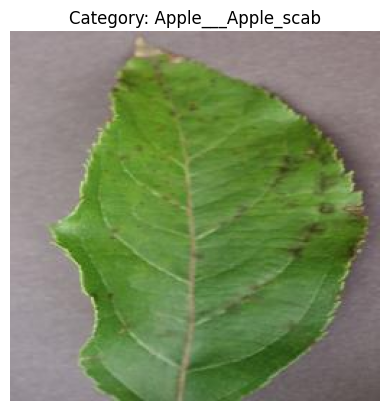

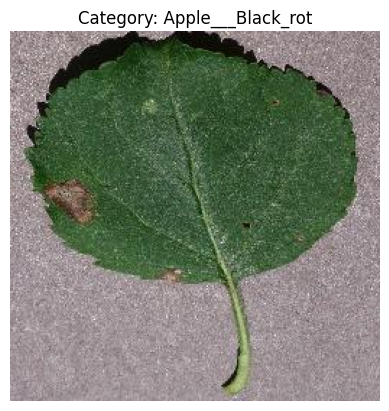

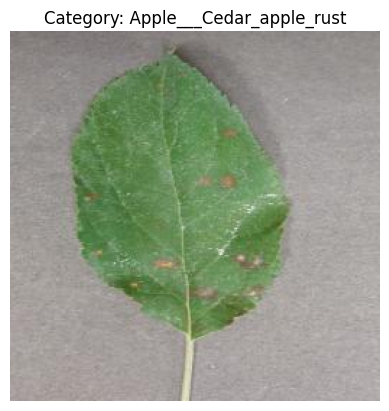

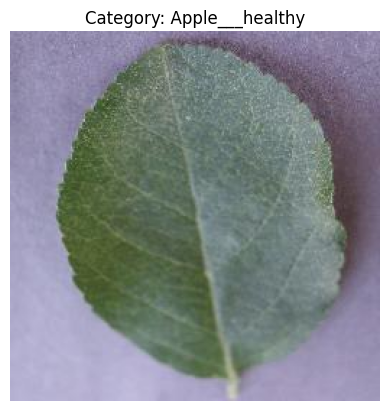

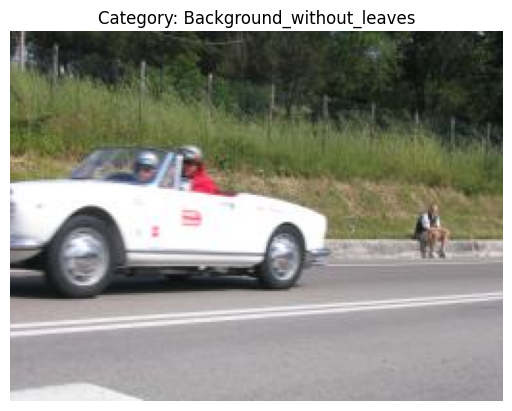

...

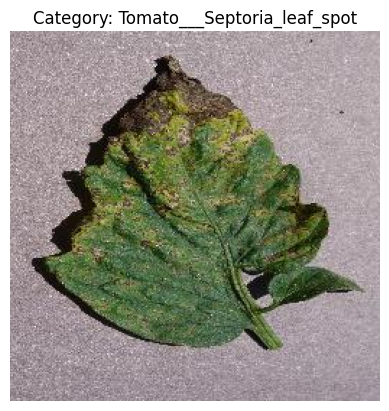

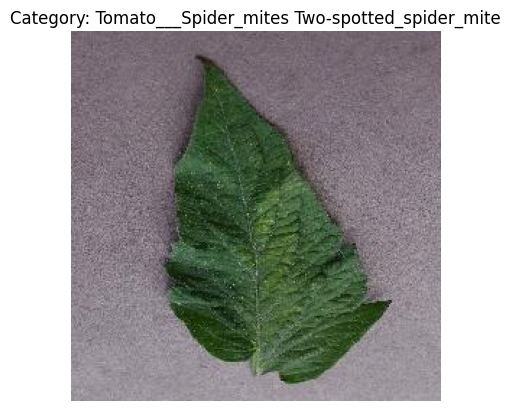

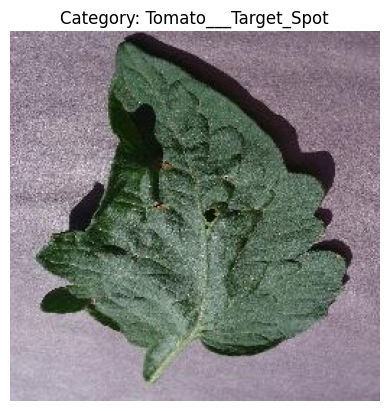

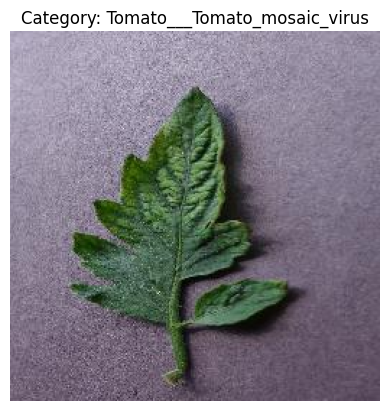

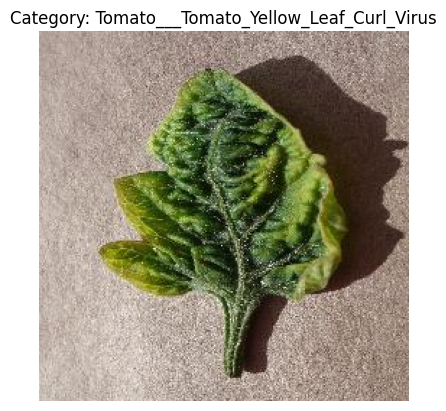

In [4]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
images = []

for category in category_names:
  category_path = os.path.join(main_dir, category)
  images_in_category = os.listdir(category_path)
  if images_in_category:
    image_file_path = os.path.join(category_path, images_in_category[0])
    img = mpimg.imread(image_file_path)
    if img is not None:
      plt.imshow(img)
      plt.axis('off')
      plt.title(f'Category: {category}')
      plt.show()
  else:
    print(f"No images found in category: {category}")

In [5]:
no_of_categories = len(category_names)
category_images_total_map = {}
for category in category_names:
  category_path = os.path.join(main_dir, category)
  images_in_category = os.listdir(category_path)
  if images_in_category:
    category_images_total_map[category] = len(images_in_category)

import pandas as pd
df = pd.DataFrame(category_images_total_map.items(), columns=['Category', 'No of Images'])

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38],
 [Text(0, 0, 'Apple___Apple_scab'),
  Text(1, 0, 'Apple___Black_rot'),
  Text(2, 0, 'Apple___Cedar_apple_rust'),
  Text(3, 0, 'Apple___healthy'),
  Text(4, 0, 'Background_without_leaves'),
  Text(5, 0, 'Blueberry___healthy'),
  Text(6, 0, 'Cherry___healthy'),
  Text(7, 0, 'Cherry___Powdery_mildew'),
  Text(8, 0, 'Corn___Cercospora_leaf_spot Gray_leaf_spot'),
  Text(9, 0, 'Corn___Common_rust'),
  Text(10, 0, 'Corn___healthy'),
  Text(11, 0, 'Corn___Northern_Leaf_Blight'),
  Text(12, 0, 'Grape___Black_rot'),
  Text(13, 0, 'Grape___Esca_(Black_Measles)'),
  Text(14, 0, 'Grape___healthy'),
  Text(15, 0, 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)'),
  Text(16, 0, 'Orange___Haunglongbing_(Citrus_greening)'),
  Text(17, 0, 'Peach___Bacterial_spot'),
  Text(18, 0, 'Peach_

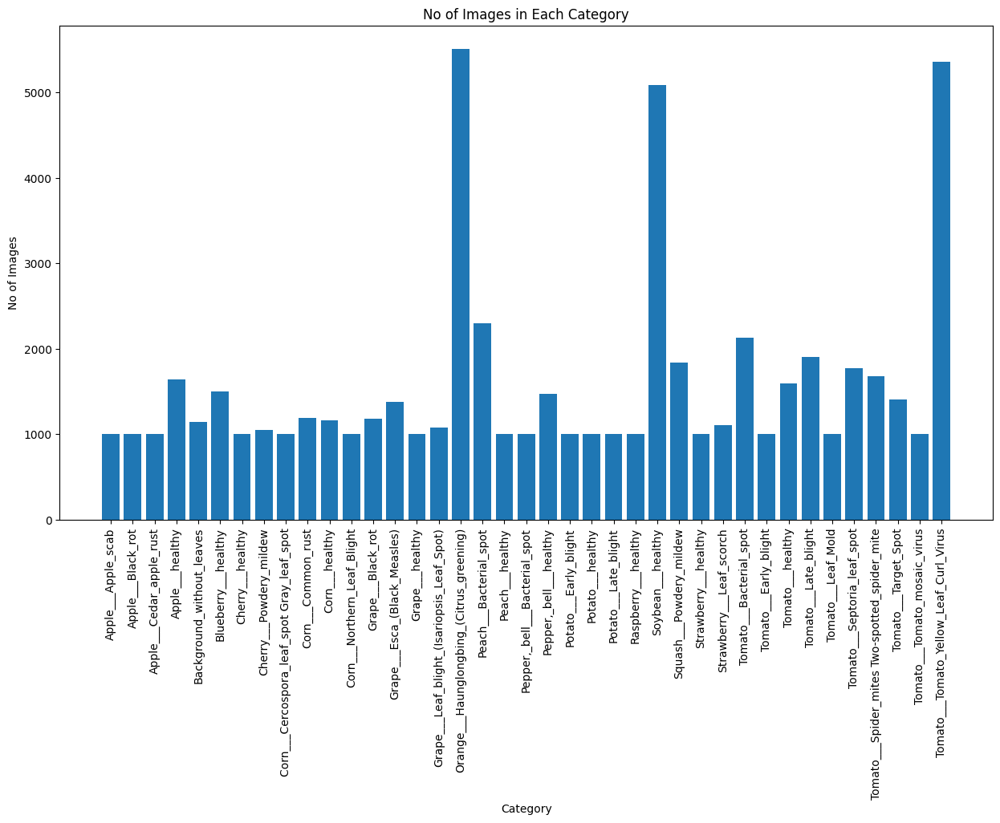

In [6]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 8))
plt.bar(df['Category'], df['No of Images'])
plt.xlabel('Category')
plt.ylabel('No of Images')
plt.title('No of Images in Each Category')
plt.xticks(rotation=90)


In [17]:
# Function for preprocessing and loading images and storing in an array (load only first 100 images )
import os
import cv2

# FUNCTION TO LOAD AND PREPROCESS IMAGE


def preprocess_and_load_images_for_category(category_path, image_size=(224, 224)):
    images = []
    images_in_category = os.listdir(category_path)
    for image_name in images_in_category[:50]:
        image_path = os.path.join(category_path, image_name)
        img_array = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        if img_array is not None:
            img_array = cv2.resize(img_array, image_size)
            # Convert grayscale to RGB by stacking the grayscale image across 3 channels
            img_array = cv2.cvtColor(img_array, cv2.COLOR_GRAY2RGB)
            images.append(img_array)
    return images


In [18]:
import numpy as np
import os
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array

all_images= []
all_labels = []

for category in category_names:
  category_path = os.path.join(main_dir, category)
  images_in_category = os.listdir(category_path)
  if images_in_category:
    images = preprocess_and_load_images_for_category(category_path)
    all_images.extend(images)
    all_labels.extend([category] * len(images))
  else:
    print(f"No images found in category: {category}")

all_images = np.array(all_images)
all_labels = np.array(all_labels)


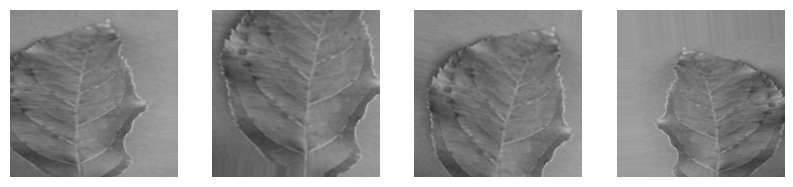

In [19]:
# Using ImageDataGenerator from Tensorflow for data augmentation of all images
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

plt.figure(figsize=(10, 10))
for i in range(4):
  augmented_image =datagen.random_transform(all_images[0])
  plt.subplot(4, 4, i+1)
  plt.imshow(augmented_image)
  plt.axis('off')
plt.show()

In [20]:
# Using One Hot Label Encoder to encode all categorial labels in all_labels into vectors
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
all_encoded_labels = label_encoder.fit_transform(all_labels)
all_one_hot_encoded_labels = to_categorical(all_encoded_labels, num_classes=len(category_names))

In [11]:
from sklearn.model_selection import train_test_split
import pandas as pd
# Split Data into Train and Test
X_train, X_test, y_train, y_test = train_test_split(all_images, all_one_hot_encoded_labels, test_size=0.2, random_state=50)
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')
df = pd.DataFrame(category_images_total_map.items(), columns=['Category', 'No of Images'])

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)
print(X_train[1].shape)
print(all_images[1].shape)

(1560, 224, 224, 3)
(1560, 39)
(390, 224, 224, 3)
(390, 39)
(224, 224, 3)
(224, 224, 3)


In [12]:
#Pre Trained VGG16 Model
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Input

def VGG16Model():
    input_tensor = Input(shape=(224, 224, 3)) 
    base_model = VGG16(include_top=False, weights='imagenet', input_tensor=input_tensor)
    base_model.trainable = False
    global_average_layer = layers.GlobalAveragePooling2D()
    prediction_layer = layers.Dense(len(category_names), activation='softmax')
    model = models.Sequential([
        base_model,
        global_average_layer,
        prediction_layer
    ])
    return model

In [13]:
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input

def efficientNetB0():
    
    base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    
    # Freeze the base model's layers to prevent them from being trained
    base_model.trainable = False
    
    # Add new layers on top of the base model
    x = base_model.output
    x = GlobalAveragePooling2D()(x)  # Global average pooling to reduce the output size
    x = Dense(128, activation='relu')(x)  # A fully connected layer with 128 units
    predictions = Dense(len(category_names), activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    return model



In [15]:
vgg16Model = VGG16Model()
vgg16Model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
vgg16Model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 39)                20007     
                                                                 
Total params: 14,734,695
Trainable params: 20,007
Non-trainable params: 14,714,688
_________________________________________________________________


In [14]:
efficientNetB0Model = efficientNetB0()
efficientNetB0Model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
efficientNetB0Model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_1[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 224, 224, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 rescaling_1 (Rescaling)        (None, 224, 224, 3)  0           ['normalization[0][0]']      

In [16]:
# train the VGG16Model and also save the model in a location
from tensorflow.keras.callbacks import EarlyStopping
vgg16Model.fit(X_train, y_train, epochs=20, batch_size=16, validation_data=(X_test, y_test))
# early_stopping = EarlyStopping(monitor='val_loss', patience=10)
# vgg16Model.save('/content/drive/MyDrive/Crop_Disease_Dataset/vgg16Model.h5')


Epoch 1/20
98/98 [==============================] - 33s 247ms/step - loss: 4.4553 - accuracy: 0.1891 - val_loss: 2.3530 - val_accuracy: 0.3692
Epoch 2/20
98/98 [==============================] - 17s 173ms/step - loss: 1.4905 - accuracy: 0.5660 - val_loss: 1.4493 - val_accuracy: 0.5667
Epoch 3/20
98/98 [==============================] - 17s 173ms/step - loss: 0.8235 - accuracy: 0.7494 - val_loss: 1.1538 - val_accuracy: 0.6513
Epoch 4/20
98/98 [==============================] - 17s 173ms/step - loss: 0.5400 - accuracy: 0.8462 - val_loss: 1.0284 - val_accuracy: 0.6769
Epoch 5/20
98/98 [==============================] - 17s 173ms/step - loss: 0.3776 - accuracy: 0.8936 - val_loss: 0.9062 - val_accuracy: 0.7231
Epoch 6/20
98/98 [==============================] - 17s 173ms/step - loss: 0.2632 - accuracy: 0.9378 - val_loss: 0.8368 - val_accuracy: 0.7282
Epoch 7/20
98/98 [==============================] - 17s 173ms/step - loss: 0.2129 - accuracy: 0.9628 - val_loss: 0.7896 - val_accuracy: 0.7436

In [15]:
efficientNetB0Model.fit(X_train, y_train, epochs=15, batch_size=16, validation_data=(X_test, y_test))

Epoch 1/15
98/98 [==============================] - 45s 183ms/step - loss: 2.1394 - accuracy: 0.4647 - val_loss: 1.0399 - val_accuracy: 0.7308
Epoch 2/15
98/98 [==============================] - 7s 75ms/step - loss: 0.6853 - accuracy: 0.8167 - val_loss: 0.6857 - val_accuracy: 0.8000
Epoch 3/15
98/98 [==============================] - 7s 75ms/step - loss: 0.3850 - accuracy: 0.9077 - val_loss: 0.5678 - val_accuracy: 0.8308
Epoch 4/15
98/98 [==============================] - 7s 74ms/step - loss: 0.2675 - accuracy: 0.9385 - val_loss: 0.5288 - val_accuracy: 0.8359
Epoch 5/15
98/98 [==============================] - 7s 74ms/step - loss: 0.2024 - accuracy: 0.9564 - val_loss: 0.4680 - val_accuracy: 0.8641
Epoch 6/15
98/98 [==============================] - 7s 74ms/step - loss: 0.1492 - accuracy: 0.9673 - val_loss: 0.4663 - val_accuracy: 0.8487
Epoch 7/15
98/98 [==============================] - 7s 74ms/step - loss: 0.1041 - accuracy: 0.9827 - val_loss: 0.4398 - val_accuracy: 0.8667
Epoch 8/15


In [26]:
# Save the VGG16 Model
vgg16Model.save('C:\\Users\\beras\\OneDrive\\Documents\\Projects\\Nudge Hackathon\\vgg16_model.h5')

NameError: name 'vgg16Model' is not defined

In [19]:
#Save the EfficientNetB0 Model
import tensorflow as tf
tf.saved_model.save(efficientNetB0Model, 'C:\\Users\\beras\\OneDrive\\Documents\\Projects\\Nudge Hackathon\\farm_model_efficientNetB0_ver_1')

INFO:tensorflow:Assets written to: C:\Users\beras\OneDrive\Documents\Projects\Nudge Hackathon\farm_model_efficientNetB0_ver_1\assets


INFO:tensorflow:Assets written to: C:\Users\beras\OneDrive\Documents\Projects\Nudge Hackathon\farm_model_efficientNetB0_ver_1\assets


In [8]:
import cv2
def preprocess_and_load_image(image_path, target_size=(224, 224)):
    if os.path.exists(image_path):
        img_array = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        if img_array is not None:
            img_array = cv2.resize(img_array, target_size)
            # Convert grayscale to RGB by stacking the grayscale image across 3 channels
            img_array = cv2.cvtColor(img_array, cv2.COLOR_GRAY2RGB)
            img_array = img_array / 255.0
            return img_array
        else:
            print("Error in reading image.")
            return None
    else:
        print("File does not exist at the specified path.")
        return None


    
    

In [9]:
# Load the current VGG16  trained model



In [10]:
import tensorflow as tf
from tensorflow.keras.models import load_model
import numpy as np
# Prediction Script For VGG16 Model
def predict_for_image_VGG16(image_path):
    vgg16Model = load_model('C:\\Users\\beras\\OneDrive\\Documents\\Projects\\Nudge Hackathon\\vgg16_model.h5')
    input_image = preprocess_and_load_image(image_path)
    if input_image is not None:
        # Expand dimensions to create a batch of 1 (Model always expects batch of images)
        input_image = np.expand_dims(input_image, axis=0)
        # Predict using the model
        y_pred = vgg16Model.predict(input_image)
        # Find the index of the highest score in the prediction
        predicted_index = np.argmax(y_pred, axis=1)[0]
        # Map the index to the category label
        predicted_category = category_names[predicted_index]
        print(predicted_category)
    else:
        print("Image preprocessing failed.")
    

In [11]:
# Prediction Script For EfficientNetB0 Model
def predict_for_image_ENB0(image_path):
    input_image = preprocess_and_load_image(image_path)
    model_path = 'C:\\Users\\beras\\OneDrive\\Documents\\Projects\\Nudge Hackathon\\farm_model_efficientNetB0_ver_1'
    effcientNetB0Model = tf.saved_model.load(model_path)
    if input_image is not None:
        # Expand dimensions to create a batch of 1 (Model always expects batch of images)
        input_image = np.expand_dims(input_image, axis=0)
        image_tensor = tf.convert_to_tensor(input_image, dtype=tf.float32)
        # Predict using the model
        infer = effcientNetB0Model.signatures['serving_default']
        print(effcientNetB0Model.signatures)
         # Perform inference
        predictions = infer(input_1=image_tensor)
        print(predictions)
        # Extract the predictions tensor
        predictions_tensor = predictions['dense_1']
        # Convert predictions to numpy array
        predictions_array = predictions_tensor.numpy().flatten()  # Flatten to shape (39,)
        print(predictions_array)
        # Find the index of the highest score in the prediction
        predicted_index = np.argmax(predictions_array)
        # Map the index to the category label
        predicted_category = category_names[predicted_index]
        print(predicted_category)
    else:
        print("Image preprocessing failed.")

In [21]:
image_path =r"C:\Users\beras\Downloads\Data for Identification of Plant Leaf Diseases Using a 9-layer Deep Convolutional Neural Network\Plant_leave_diseases_dataset_with_augmentation\Background_without_leaves\image (19).JPG"
predict_for_image_ENB0(image_path)

OSError: SavedModel file does not exist at: C:\Users\beras\OneDrive\Documents\Projects\Nudge Hackathon\farm_model_efficientNetB0_ver_1\{saved_model.pbtxt|saved_model.pb}

In [22]:
image_path =r"C:\Users\beras\Downloads\Data for Identification of Plant Leaf Diseases Using a 9-layer Deep Convolutional Neural Network\Plant_leave_diseases_dataset_with_augmentation\Background_without_leaves\image (19).JPG"
predict_for_image_VGG16(image_path)

1/1 [==============================] - 8s 8s/step
Apple___Apple_scab


In [14]:
# evaluate the VGG16 model
test_loss, test_acc = vgg16Model.evaluate(X_test, y_test, verbose=0)
print('Test loss:', test_loss)
print('Test accuracy:', test_acc*100)

Test loss: 0.6579830050468445
Test accuracy: 81.28204941749573


In [24]:
# evaluate the EfficientNetB0 model
test_loss, test_acc = efficientNetB0Model.evaluate(X_test, y_test, verbose=0)
print('Test loss:', test_loss)
print('Test accuracy:', test_acc*100)

Test loss: 0.35231733322143555
Test accuracy: 89.2307698726654


In [25]:
# Testing VGG16 Model
y_pred = vgg16Model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = np.argmax(y_test, axis=1)

NameError: name 'vgg16Model' is not defined

In [23]:
# Testing EfficientNetB0 Model
y_pred = efficientNetB0Model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = np.argmax(y_test, axis=1)

13/13 [==============================] - 4s 95ms/step


In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
print("Confusion Matrix")
print(confusion_matrix(y_true_classes, y_pred_classes))
print("\nClassification Report")
print(classification_report(y_true_classes, y_pred_classes))

Confusion Matrix
[[ 9  1  1 ...  0  0  0]
 [ 0 10  0 ...  0  0  0]
 [ 0  0  7 ...  0  0  0]
 ...
 [ 0  0  0 ...  5  0  0]
 [ 0  0  0 ...  0 10  0]
 [ 0  0  0 ...  0  0 10]]

Classification Report
              precision    recall  f1-score   support

           0       0.82      0.82      0.82        11
           1       0.83      0.91      0.87        11
           2       0.88      0.88      0.88         8
           3       0.80      0.73      0.76        11
           4       1.00      1.00      1.00        10
           5       0.88      0.88      0.88        17
           6       0.88      0.88      0.88         8
           7       1.00      1.00      1.00         6
           8       0.83      0.62      0.71         8
           9       1.00      1.00      1.00        13
          10       0.57      0.67      0.62         6
          11       1.00      1.00      1.00         9
          12       0.57      0.89      0.70         9
          13       1.00      0.60      0.75    

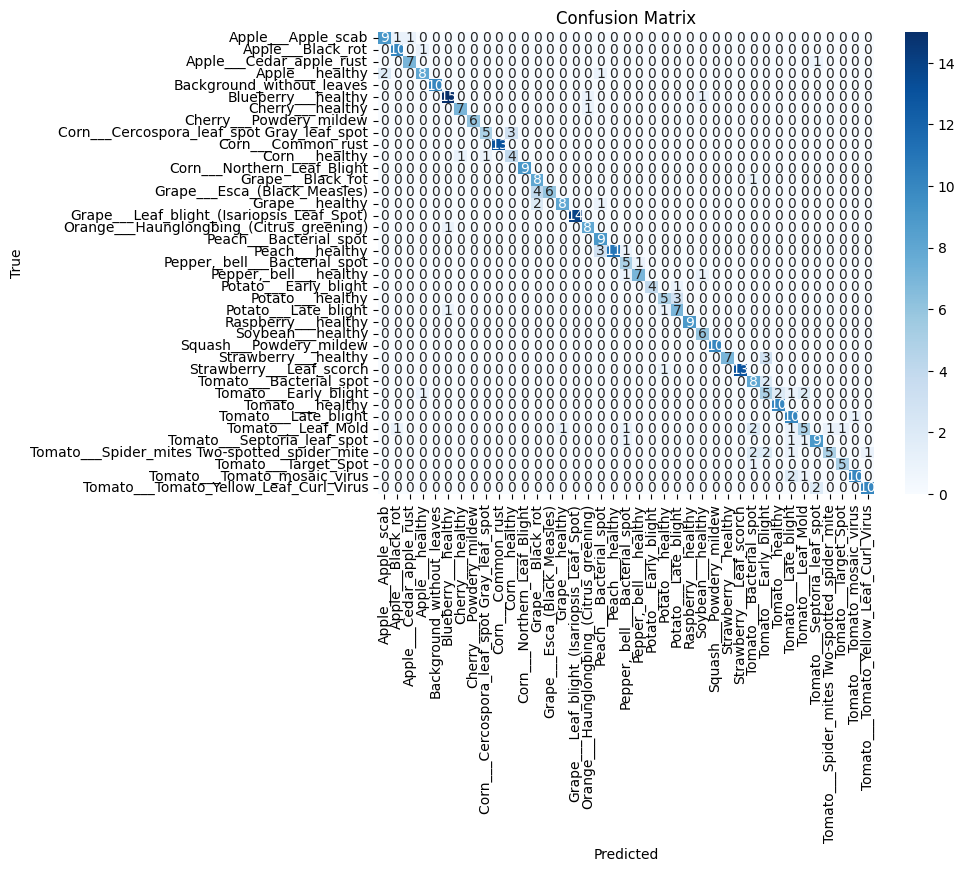

In [18]:
# PLOT CONFUSION MATRIX
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_true_classes, y_pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=category_names, yticklabels=category_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()